In [1]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium.plugins import HeatMap

import warnings
warnings.filterwarnings('ignore')


In [2]:
df = pd.read_csv('bayut_selling_properties.csv')

In [3]:
# configures the pandas library to display all columns of a DataFrame

pd.set_option("display.max_columns", None)

In [4]:
# display number of rows and columns
df.shape

(41381, 22)

In [5]:
df.head()

,price,price_category,type,beds,baths,address,furnishing,completion_status,post_date,average_rent,building_name,year_of_completion,total_parking_spaces,total_floors,total_building_area_sqft,elevators,area_name,city,country,Latitude,Longitude,purpose
0,1450000,Medium,Apartment,1,2,"The Bay, Business Bay, Dubai",Furnished,Ready,2024-04-15,0,Unknown,0,0,0,0,0,Business Bay,Dubai,UAE,25.189427,55.264819,For Sale
1,6600000,High,Townhouse,5,5,"Brookfield, DAMAC Hills, Dubai",Unfurnished,Ready,2024-04-15,0,Unknown,0,0,0,0,0,DAMAC Hills,Dubai,UAE,25.028148,55.264246,For Sale
2,4825000,High,Apartment,2,3,"Vida Residence Downtown, Downtown Dubai, Dubai",Unfurnished,Ready,2024-04-18,288929,VIDA RESIDENCE DOWNTOWN,2018,510,56,1,11,Downtown Dubai,Dubai,UAE,25.186684,55.274705,For Sale
3,980000,Average,Apartment,3,3,"Building 39, Al Reef Downtown, Al Reef, Abu Dhabi",Unfurnished,Ready,2024-01-03,73384,Unknown,0,0,0,0,0,Al Reef,Abu Dhabi,UAE,24.466437,54.656891,For Sale
4,2499999,Medium,Townhouse,3,4,"Nima, The Valley, Dubai",Furnished,Off-Plan,2024-02-28,0,Unknown,0,0,0,0,0,The Valley,Dubai,UAE,25.019221,55.447201,For Sale


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41381 entries, 0 to 41380
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     41381 non-null  int64  
 1   price_category            41381 non-null  object 
 2   type                      41381 non-null  object 
 3   beds                      41381 non-null  int64  
 4   baths                     41381 non-null  int64  
 5   address                   41381 non-null  object 
 6   furnishing                41381 non-null  object 
 7   completion_status         41381 non-null  object 
 8   post_date                 41381 non-null  object 
 9   average_rent              41381 non-null  int64  
 10  building_name             41381 non-null  object 
 11  year_of_completion        41381 non-null  int64  
 12  total_parking_spaces      41381 non-null  int64  
 13  total_floors              41381 non-null  int64  
 14  total_

In [7]:
df.describe()

,price,beds,baths,average_rent,year_of_completion,total_parking_spaces,total_floors,total_building_area_sqft,elevators,Latitude,Longitude
count,4.138100e+04,41381.000000,41381.000000,4.138100e+04,41381.000000,41381.000000,41381.000000,41381.000000,41381.000000,41363.000000,41363.000000
mean,3.788624e+06,2.190957,3.007540,9.292880e+04,681.112491,172.559073,13.212126,142.931273,2.304463,25.037851,55.158407
std,8.482870e+06,1.567855,1.785553,2.503703e+05,953.886883,353.899074,20.298365,248.719849,4.440953,0.437348,0.513871
min,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,15.175847,43.351928
25%,1.100000e+06,1.000000,2.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,25.026710,55.135252
50%,2.000000e+06,2.000000,3.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,25.078641,55.245999
75%,3.600000e+06,3.000000,4.000000,1.243790e+05,2012.000000,198.000000,22.000000,211.000000,4.000000,25.189427,55.307913
max,4.825000e+08,11.000000,11.000000,2.807952e+07,2024.000000,2929.000000,89.000000,997.000000,42.000000,25.797689,56.361294


In [8]:
df.dtypes

,0
price,int64
price_category,object
type,object
beds,int64
baths,int64
address,object
furnishing,object
completion_status,object
post_date,object
average_rent,int64


In [9]:
df.isnull().sum().sort_values(ascending=False)

,0
Longitude,18
Latitude,18
price,0
price_category,0
country,0
city,0
area_name,0
elevators,0
total_building_area_sqft,0
total_floors,0


In [10]:
df = df.dropna(subset=['Latitude', 'Longitude'])

In [11]:
df.duplicated().sum()

0

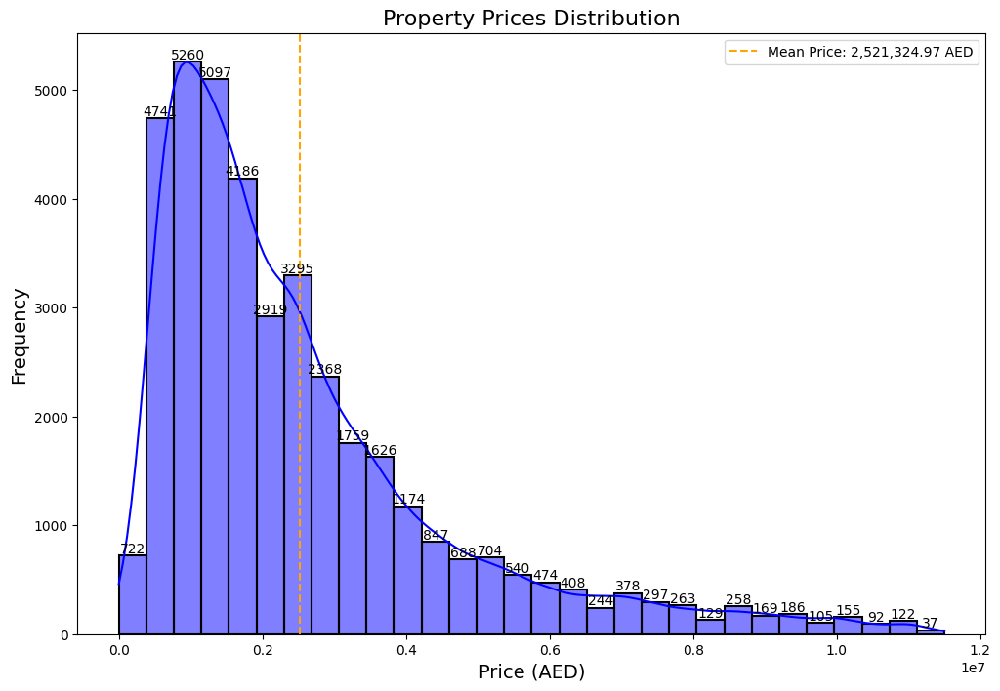

In [12]:
# Preparing data by filtering extreme values
filtered_data = df[df['price'] < df['price'].quantile(0.95)]

plt.figure(figsize=(12, 8))
ax = sns.histplot(filtered_data['price'], bins=30, kde=True, color='blue', edgecolor='black', linewidth=1.5)
plt.title('Property Prices Distribution', fontsize=16)
plt.xlabel('Price (AED)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.axvline(filtered_data['price'].mean(), color='Orange', linestyle='--', label=f'Mean Price: {filtered_data["price"].mean():,.2f} AED')
plt.legend()

# Annotate each bar with the count
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=10, color='black')

plt.show()

In [18]:
# Creating the histogram using Plotly
fig = go.Figure(data=[go.Histogram(x=filtered_data['price'], nbinsx=30)])
fig.update_traces(marker_color='orange', marker_line_color='black', marker_line_width=1.5)
fig.update_layout(title_text='Property Prices', xaxis_title='Price (AED)', yaxis_title='Frequency')

# Adding annotations for each bar's count
for i, bin_val in enumerate(np.histogram(filtered_data['price'], bins=30)[0]):
    fig.add_annotation(x=(np.histogram(filtered_data['price'], bins=30)[1][i] + np.histogram(filtered_data['price'], bins=30)[1][i+1])/2,
                       y=bin_val,
                       text=str(bin_val),
                       showarrow=False,
                       yshift=10)

fig.show()

In [19]:
fig = px.scatter_mapbox(df, lat='Latitude', lon='Longitude', color='price_category',
                        color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=7,
                        hover_data={
                            'price': True,
                            'type': True,
                            'furnishing': True,
                            'completion_status': True,
                            'area_name': True,
                            'city': True,
                            'post_date': True,
                            'address': True
                        },
                        mapbox_style="carto-positron")

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


In [20]:
# Create a map centered around an average location

# Using a custom tileset for satellite view
map_heat_local = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()],
                            zoom_start=7,
                            tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                            attr='Esri',
                            name='Esri Satellite',
                            control=True)

# Define the HTML for the title
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Property Price Distribution Heatmap</b></h3>
             '''

# Add the title to the map
map_heat_local.get_root().html.add_child(folium.Element(title_html))

# Add a heat map layer for property prices
max_price = df['price'].max()
heat_data_local = [[row['Latitude'], row['Longitude'], row['price']/max_price] for index, row in df.iterrows() if not pd.isna(row['Latitude'])]

HeatMap(heat_data_local).add_to(map_heat_local)

# Optionally, add tile layer switcher to toggle between satellite and other map views
folium.LayerControl().add_to(map_heat_local)

# Display the map
map_heat_local

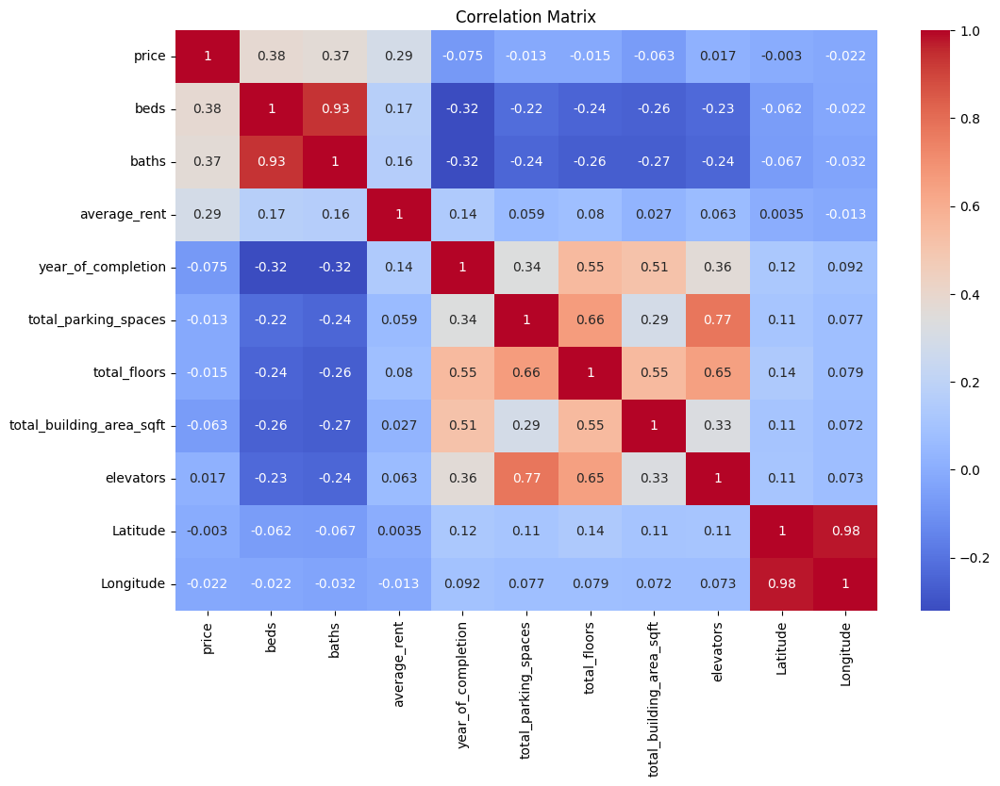

In [21]:
# Ensure only numeric columns are included
numeric_df = df.select_dtypes(include=[np.number])

# Calculating the correlation matrix
correlation_matrix = numeric_df.corr()

# Visualizing the correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


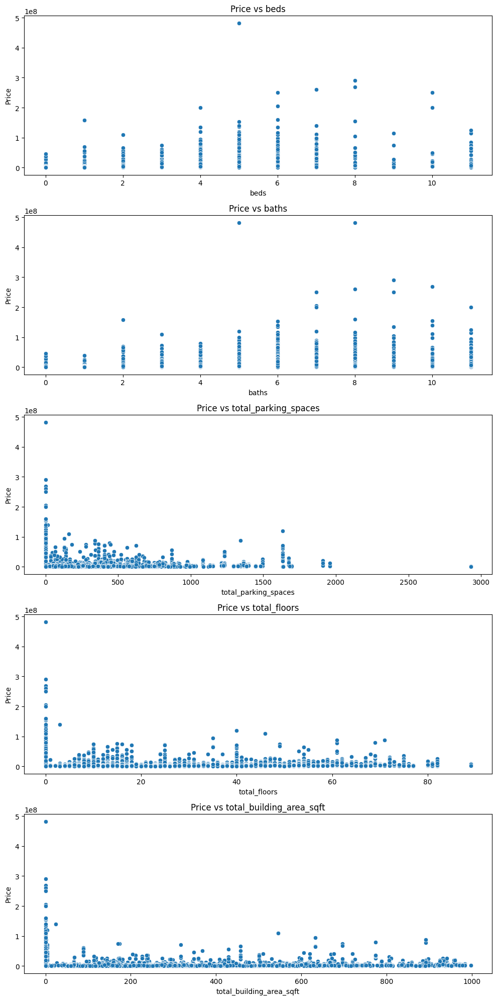

In [22]:
# Selecting a few numerical features to plot against price
features_to_plot = ['beds', 'baths', 'total_parking_spaces', 'total_floors', 'total_building_area_sqft']

fig, axes = plt.subplots(nrows=len(features_to_plot), figsize=(10, 20))

for i, feature in enumerate(features_to_plot):
    sns.scatterplot(data=df, x=feature, y='price', ax=axes[i])
    axes[i].set_title(f'Price vs {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Price')

plt.tight_layout()
plt.show()

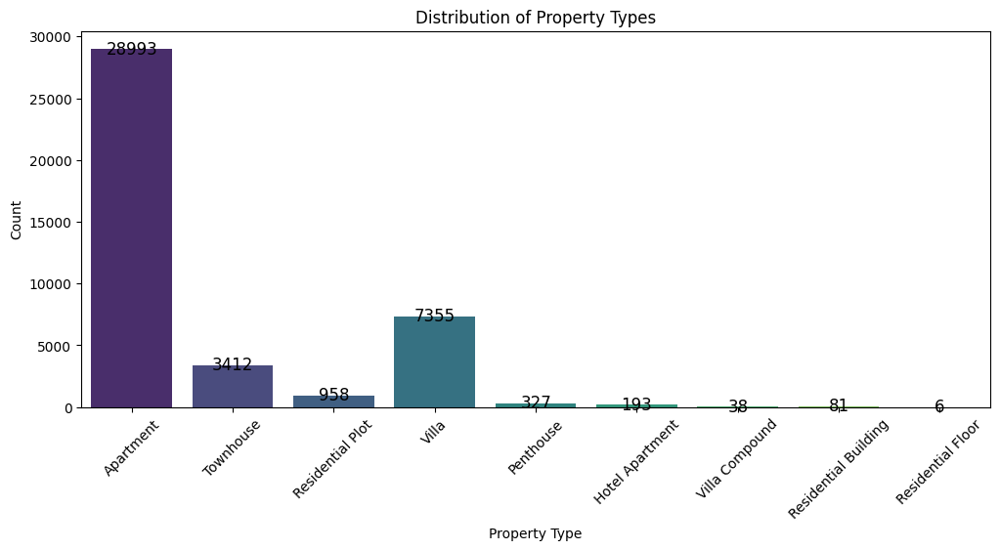

In [23]:
plt.figure(figsize=(12, 5))
ax_type = sns.countplot(data=df, x='type', palette='viridis')
plt.title('Distribution of Property Types')
plt.xlabel("Property Type")
plt.ylabel("Count")
plt.xticks(rotation=45)
for p in ax_type.patches:
    ax_type.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', fontsize=12, color='black')
plt.show()

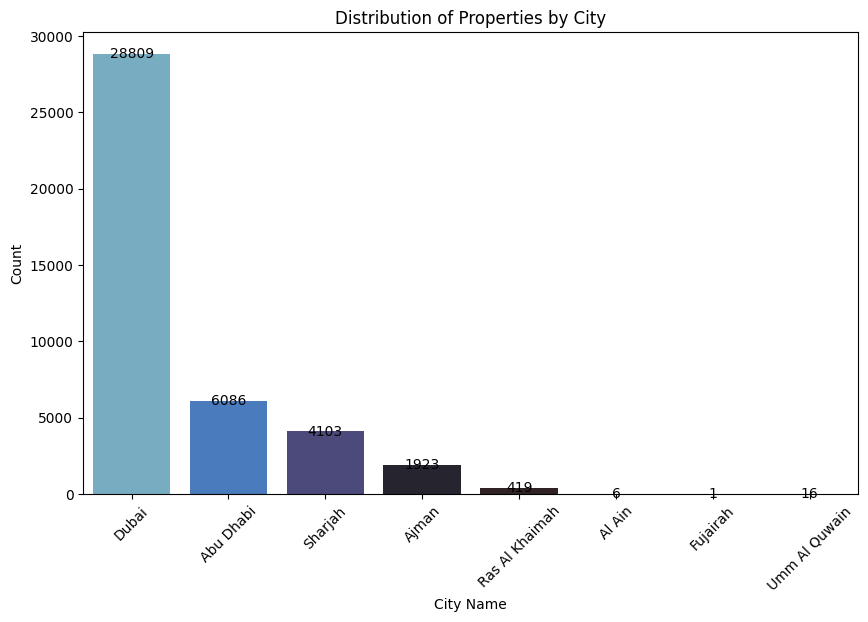

In [24]:
plt.figure(figsize=(10, 6))
ax_city = sns.countplot(data=df, x='city', palette='icefire')
plt.title('Distribution of Properties by City')
plt.xlabel("City Name")
plt.ylabel("Count")
plt.xticks(rotation=45)
for p in ax_city.patches:
    ax_city.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', fontsize=10, color='black')
plt.show()


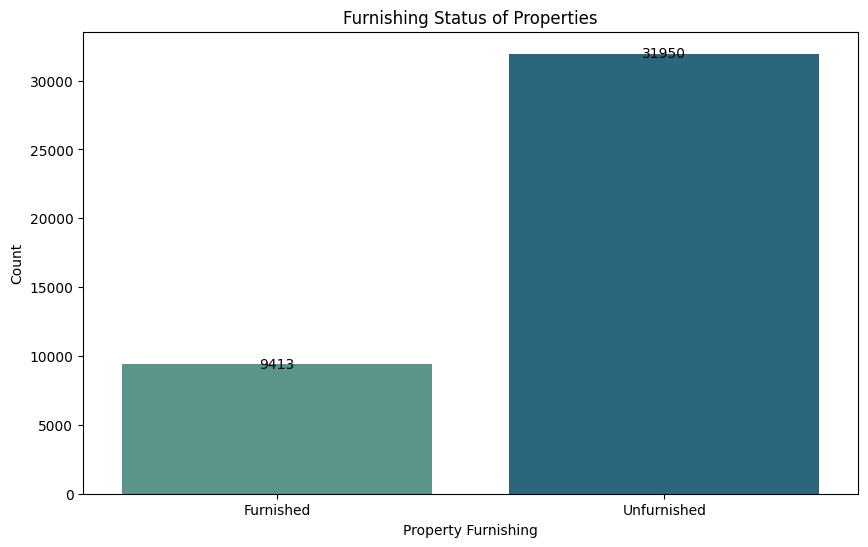

In [25]:
# Bar chart for 'furnishing'
plt.figure(figsize=(10, 6))
ax_furnishing = sns.countplot(data=df, x='furnishing', palette='crest')
plt.title('Furnishing Status of Properties')
plt.xlabel("Property Furnishing")
plt.ylabel("Count")
for p in ax_furnishing.patches:
    ax_furnishing.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                           ha='center', va='center', fontsize=10, color='black')
plt.show()

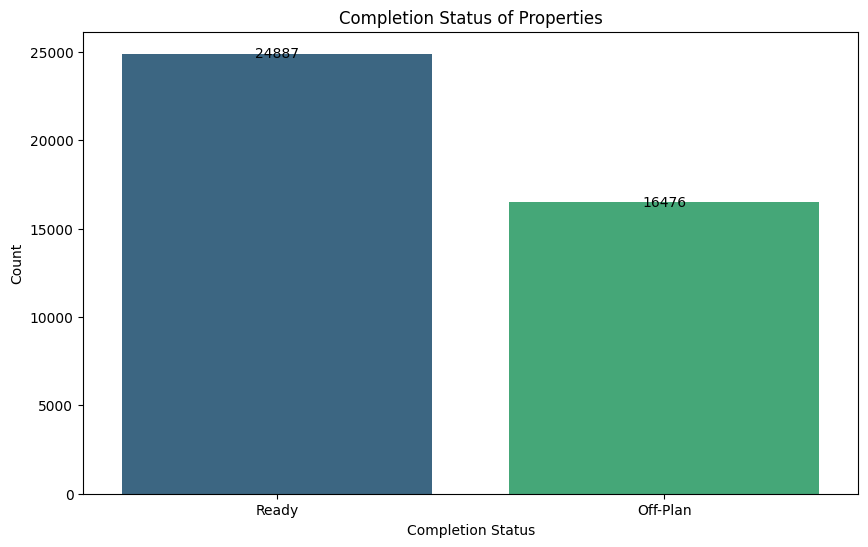

In [26]:
# Bar chart for 'completion_status'
plt.figure(figsize=(10, 6))
ax_completion = sns.countplot(data=df, x='completion_status', palette='viridis')
plt.title('Completion Status of Properties')
plt.xlabel("Completion Status")
plt.ylabel("Count")
for p in ax_completion.patches:
    ax_completion.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                           ha='center', va='center', fontsize=10, color='black')
plt.show()

In [27]:
df['post_date'] = pd.to_datetime(df['post_date'])
df['weekday'] = df['post_date'].dt.weekday

# Group by weekday and count properties
weekday_counts = df.groupby('weekday').size().reset_index(name='count')

# Sort by weekday for meaningful order in visualization
weekday_counts.sort_values('weekday', inplace=True)

# Map weekday numbers to weekday names for better readability in the chart
weekday_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
weekday_counts['weekday_name'] = weekday_counts['weekday'].map(weekday_names)

# Visualizing with Plotly for an interactive bar chart
fig = px.bar(weekday_counts, x='weekday_name', y='count', title='Number of Properties Listed by Weekday',
             labels={'count': 'Number of Listings', 'weekday_name': 'Weekday'})

# Add annotations for each bar to display the count
for index, row in weekday_counts.iterrows():
    fig.add_annotation(x=row['weekday_name'], y=row['count'], text=str(row['count']),
                       showarrow=False, yshift=10, font=dict(color="black", size=12))

fig.update_layout(xaxis_title='Weekday', yaxis_title='Number of Listings')
fig.update_traces(marker_color='rgb(10,140,208)', marker_line_color='rgb(8,48,107)', marker_line_width=1.5)
fig.show()

In [28]:
# Ensure the data types are correct, especially 'price' which should be numeric
df['price'] = pd.to_numeric(df['price'], errors='coerce')
df.dropna(subset=['price'], inplace=True)  # Remove rows where price could not be converted

# Group data by city and price category to count properties
city_price_counts = df.groupby(['city', 'price_category']).size().reset_index(name='Count')

# Calculate highest, lowest, and average property price for each group
city_price_stats = df.groupby(['city', 'price_category']).agg(
    Highest_Price=('price', 'max'),
    Lowest_Price=('price', 'min'),
    Average_Price=('price', 'mean')
).reset_index()

# Merge the count data with price statistics
city_price_merged = city_price_counts.merge(city_price_stats, on=['city', 'price_category'])

# Create the bar chart again with the correct hover information
fig = px.bar(city_price_merged, x='city', y='Count', color='price_category',
             title='Distribution of Price Categories by City',
             labels={'Count': 'Number of Properties'},
             barmode='group')

# Update layout for better visualization
fig.update_layout(xaxis_title='City',
                  yaxis_title='Number of Properties',
                  xaxis={'categoryorder':'total descending'},
                  legend_title_text='Price Category')

# Add custom data for hover info, fixing the display of price category
fig.update_traces(
    hovertemplate="<br>".join([
        "City: %{x}",
        "Price Category: %{marker.color}",
        "Properties Count: %{y}",
        "Highest Price (AED): %{customdata[0]}",
        "Lowest Price (AED): %{customdata[1]}",
        "Average Price (AED): %{customdata[2]:.2f}"
    ]),
    customdata=np.stack((city_price_merged['Highest_Price'], city_price_merged['Lowest_Price'], city_price_merged['Average_Price'], city_price_merged['price_category']), axis=-1)
)

# Ensure the 'Price Category' is correctly displayed instead of the color reference
fig.update_traces(hovertemplate="<br>".join([
    "City: %{x}",
    "Price Category: %{customdata[3]}",
    "Properties Count: %{y}",
    "Highest Price (AED): %{customdata[0]}",
    "Lowest Price (AED): %{customdata[1]}",
    "Average Price (AED): %{customdata[2]:.2f}"
]))

fig.show()

In [29]:
# Filter the data for the cities of interest: Dubai, Abu Dhabi, Sharjah, and Ajman
cities_data = df[df['city'].isin(['Dubai', 'Abu Dhabi', 'Sharjah', 'Ajman'])]

# Group by city and calculate average price
city_prices = cities_data.groupby('city')['price'].mean().reset_index()

# Create a bar chart to compare average prices across Dubai, Abu Dhabi, Sharjah, and Ajman
fig = px.bar(city_prices, x='city', y='price',
             title='Average Property Prices: Dubai vs Abu Dhabi vs Sharjah vs Ajman',
             labels={'price': 'Average Price', 'city': 'City'},
             color='city',
             color_continuous_scale=px.colors.sequential.Rainbow)

# Update layout for better visualization
fig.update_layout(xaxis_title='City',
                  yaxis_title='Average Price (AED)',
                  coloraxis_showscale=True)
fig.show()


In [30]:
# Filter the data for the city of Dubai and then find the top 10 highest price areas
dubai_data = df[df['city'] == 'Dubai']

# Group by area and calculate average price, then sort and get top 10
top_areas_dubai = dubai_data.groupby('area_name')['price'].mean().sort_values(ascending=False).head(10).reset_index()

# Create a bar chart to show top 10 highest price areas in Dubai
fig = px.bar(top_areas_dubai, x='area_name', y='price',
             title='Top 10 Highest Price Areas in Dubai',
             labels={'price': 'Average Price', 'area_name': 'Area Name'},
             color='price',
             color_continuous_scale=px.colors.sequential.Viridis)

# Update layout for better visualization
fig.update_layout(xaxis_title='Area Name',
                  yaxis_title='Average Price (AED)',
                  coloraxis_showscale=True)
fig.show()

In [31]:
dubai_data_low = df[df['city'] == 'Dubai']

# Group by area and calculate average price, then sort and get the bottom 10
bottom_areas_dubai = dubai_data_low.groupby('area_name')['price'].mean().sort_values(ascending=True).head(10).reset_index()

# Create a bar chart to show the top 10 lowest price areas in Dubai
fig = px.bar(bottom_areas_dubai, x='area_name', y='price',
             title='Top 10 Lowest Price Areas in Dubai',
             labels={'price': 'Average Price', 'area_name': 'Area Name'},
             color='price',
             color_continuous_scale=px.colors.sequential.Blues)

# Update layout for better visualization
fig.update_layout(xaxis_title='Area Name',
                  yaxis_title='Average Price (AED)',
                  coloraxis_showscale=True)
fig.show()

In [32]:
# Filter the data for the city of Abu Dhabi
abu_dhabi_data = df[df['city'] == 'Abu Dhabi']

# Group by area, calculate average price, then sort and get top 10 highest price areas
top_areas_abu_dhabi = abu_dhabi_data.groupby('area_name')['price'].mean().sort_values(ascending=False).head(10).reset_index()

# Create a bar chart for the top 10 highest price areas in Abu Dhabi
fig_high = px.bar(top_areas_abu_dhabi, x='area_name', y='price',
                  title='Top 10 Highest Price Areas in Abu Dhabi',
                  labels={'price': 'Average Price', 'area_name': 'Area Name'},
                  color='price',
                  color_continuous_scale=px.colors.sequential.Viridis)

fig_high.show()

In [33]:
# Group by area, calculate average price, then sort and get top 10 lowest price areas
bottom_areas_abu_dhabi = abu_dhabi_data.groupby('area_name')['price'].mean().sort_values(ascending=True).head(10).reset_index()

# Create a bar chart for the top 10 lowest price areas in Abu Dhabi
fig_low = px.bar(bottom_areas_abu_dhabi, x='area_name', y='price',
                 title='Top 10 Lowest Price Areas in Abu Dhabi',
                 labels={'price': 'Average Price', 'area_name': 'Area Name'},
                 color='price',
                 color_continuous_scale=px.colors.sequential.Blues)

# Update layout for both figures for better visualization
fig_high.update_layout(xaxis_title='Area Name',
                       yaxis_title='Average Price (AED)',
                       coloraxis_showscale=True)

fig_low.update_layout(xaxis_title='Area Name',
                      yaxis_title='Average Price (AED)',
                      coloraxis_showscale=True)

fig_low.show()

In [34]:
# Calculating descriptive statistics
def calculate_statistics(df, column):
    stats = {
        "Mean": df[column].mean(),
        "Median": df[column].median(),
        "Mode": df[column].mode()[0],  # mode() returns a Series, take the first mode
        "Standard Deviation": df[column].std(),
        "Minimum": df[column].min(),
        "Maximum": df[column].max()
    }
    return stats

# Applying the function to relevant columns
statistics_price = calculate_statistics(df, 'price')
statistics_beds = calculate_statistics(df, 'beds')
statistics_baths = calculate_statistics(df, 'baths')
statistics_parking = calculate_statistics(df, 'total_parking_spaces')

# Displaying the statistics
print("Statistics for Price:", statistics_price)
print("Statistics for Beds:", statistics_beds)
print("Statistics for Baths:", statistics_baths)
print("Statistics for Parking Spaces:", statistics_parking)

Statistics for Price: {'Mean': 3789093.6489374563, 'Median': 2000000.0, 'Mode': 2500000, 'Standard Deviation': 8484387.37681732, 'Minimum': 0, 'Maximum': 482500000}
Statistics for Beds: {'Mean': 2.189904020501414, 'Median': 2.0, 'Mode': 1, 'Standard Deviation': 1.566485892167253, 'Minimum': 0, 'Maximum': 11}
Statistics for Baths: {'Mean': 3.0068902158934314, 'Median': 3.0, 'Mode': 2, 'Standard Deviation': 1.7848807905296897, 'Minimum': 0, 'Maximum': 11}
Statistics for Parking Spaces: {'Mean': 172.63416580035297, 'Median': 0.0, 'Mode': 0, 'Standard Deviation': 353.9577588067186, 'Minimum': 0, 'Maximum': 2929}


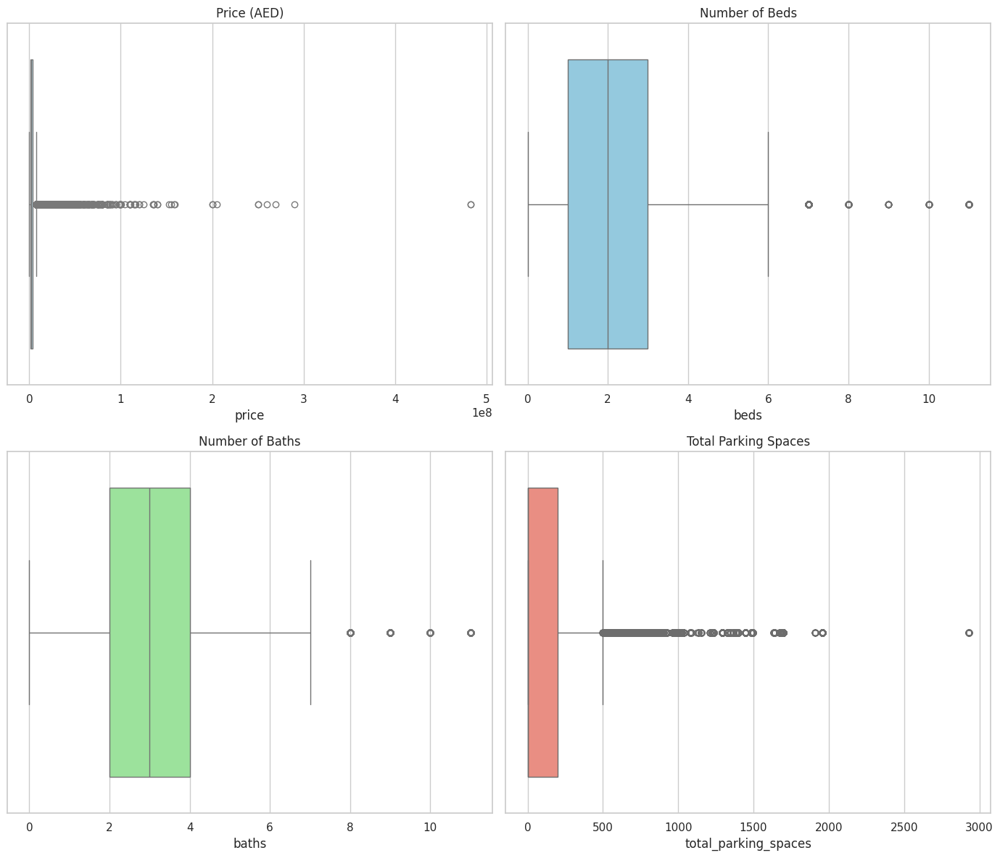

In [35]:
# Setting up the style
sns.set_theme(style="whitegrid")

# Preparing to plot box plots for beds, baths, parking spaces, and price
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Box plot for 'price'
sns.boxplot(ax=axes[0, 0], data=df, x='price', color='lightblue')
axes[0, 0].set_title('Price (AED)')

# Box plot for 'beds'
sns.boxplot(ax=axes[0, 1], data=df, x='beds', color='skyblue')
axes[0, 1].set_title('Number of Beds')

# Box plot for 'baths'
sns.boxplot(ax=axes[1, 0], data=df, x='baths', color='lightgreen')
axes[1, 0].set_title('Number of Baths')

# Box plot for 'total_parking_spaces'
sns.boxplot(ax=axes[1, 1], data=df, x='total_parking_spaces', color='salmon')
axes[1, 1].set_title('Total Parking Spaces')

plt.tight_layout()
plt.show()


In [36]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtering the data without outliers
    filtered_data = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return filtered_data

# Applying the function to each column
data_filtered = df.copy()
for column in ['beds', 'baths', 'total_parking_spaces', 'price']:
    data_filtered = remove_outliers(data_filtered, column)

# Comparing shapes to see how many outliers were removed
original_shape = df.shape
filtered_shape = data_filtered.shape

print(f'Original data shape: {original_shape}')
print(f'Filtered data shape: {filtered_shape}')

Original data shape: (41363, 23)
Filtered data shape: (32149, 23)


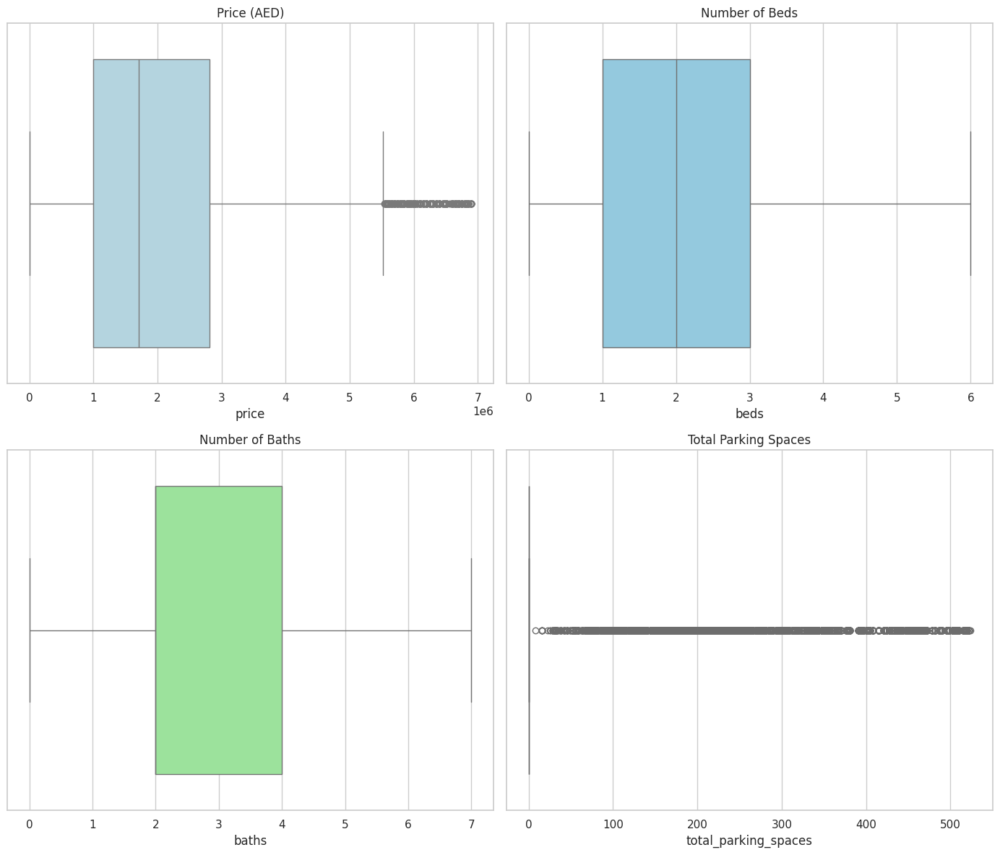

In [37]:
# confirm to check all outliers are removed

# Preparing to plot box plots for beds, baths, parking spaces, and price
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Box plot for 'price'
sns.boxplot(ax=axes[0, 0], data=data_filtered, x='price', color='lightblue')
axes[0, 0].set_title('Price (AED)')

# Box plot for 'beds'
sns.boxplot(ax=axes[0, 1], data=data_filtered, x='beds', color='skyblue')
axes[0, 1].set_title('Number of Beds')

# Box plot for 'baths'
sns.boxplot(ax=axes[1, 0], data=data_filtered, x='baths', color='lightgreen')
axes[1, 0].set_title('Number of Baths')

# Box plot for 'total_parking_spaces'
sns.boxplot(ax=axes[1, 1], data=data_filtered, x='total_parking_spaces', color='salmon')
axes[1, 1].set_title('Total Parking Spaces')


plt.tight_layout()
plt.show()